In [1]:
import os
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
start = "/kaggle/input/waste-classification-data/DATASET"

types = []
files = []

for f_0 in os.listdir(start):
    temp = os.path.join(start, f_0)
    for f_1 in os.listdir(temp):
        typ = os.path.join(temp, f_1)
        for f_2 in os.listdir(typ):
            if f_0 == 'TRAIN':
                file = os.path.join(typ, f_2)
                files.append(file)
                types.append(f_1)

            if f_0 == 'TEST':
                file = os.path.join(typ, f_2)
                files.append(file)
                types.append(f_1)

                
df = pd.DataFrame({'FILE': files, 'TYPE': types})
df

,FILE,TYPE
0,/kaggle/input/waste-classification-data/DATASE...,R
1,/kaggle/input/waste-classification-data/DATASE...,R
2,/kaggle/input/waste-classification-data/DATASE...,R
3,/kaggle/input/waste-classification-data/DATASE...,R
4,/kaggle/input/waste-classification-data/DATASE...,R
...,...,...
25072,/kaggle/input/waste-classification-data/DATASE...,O
25073,/kaggle/input/waste-classification-data/DATASE...,O
25074,/kaggle/input/waste-classification-data/DATASE...,O
25075,/kaggle/input/waste-classification-data/DATASE...,O


<Axes: xlabel='TYPE', ylabel='count'>

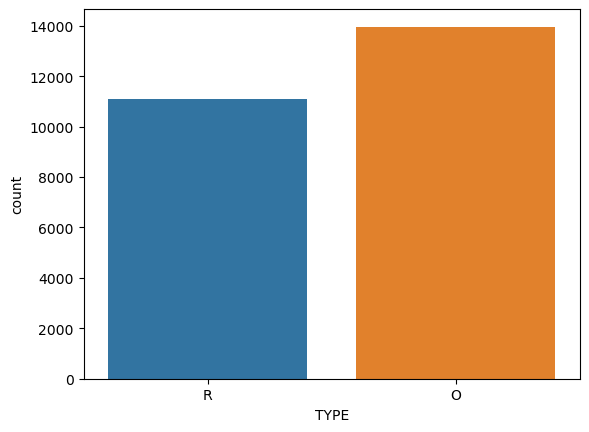

In [3]:
sns.countplot(data=df, x='TYPE')

In [4]:
df.shape

(25077, 2)

In [5]:
sample_size = df['TYPE'].value_counts()['R']
sample_size

11111

In [6]:
r_df = df[df['TYPE'] == 'R'].copy()
r_df = r_df.sample(sample_size)
o_df = df[df['TYPE'] == 'O'].copy()
o_df = o_df.sample(sample_size)
bal_df = pd.concat([r_df, o_df])

bal_df

,FILE,TYPE
8366,/kaggle/input/waste-classification-data/DATASE...,R
6823,/kaggle/input/waste-classification-data/DATASE...,R
6296,/kaggle/input/waste-classification-data/DATASE...,R
9250,/kaggle/input/waste-classification-data/DATASE...,R
3629,/kaggle/input/waste-classification-data/DATASE...,R
...,...,...
1728,/kaggle/input/waste-classification-data/DATASE...,O
2028,/kaggle/input/waste-classification-data/DATASE...,O
22267,/kaggle/input/waste-classification-data/DATASE...,O
12656,/kaggle/input/waste-classification-data/DATASE...,O


<Axes: xlabel='TYPE', ylabel='count'>

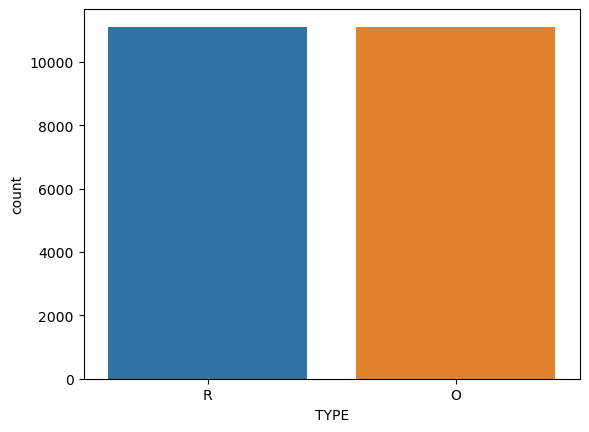

In [7]:
sns.countplot(data=bal_df, x='TYPE')

In [8]:
onehot_df = pd.get_dummies(bal_df['TYPE'])
bal_df = pd.concat([bal_df, onehot_df], axis=1)
bal_df = bal_df.drop(columns=['TYPE'])

bal_df

,FILE,O,R
8366,/kaggle/input/waste-classification-data/DATASE...,0,1
6823,/kaggle/input/waste-classification-data/DATASE...,0,1
6296,/kaggle/input/waste-classification-data/DATASE...,0,1
9250,/kaggle/input/waste-classification-data/DATASE...,0,1
3629,/kaggle/input/waste-classification-data/DATASE...,0,1
...,...,...,...
1728,/kaggle/input/waste-classification-data/DATASE...,1,0
2028,/kaggle/input/waste-classification-data/DATASE...,1,0
22267,/kaggle/input/waste-classification-data/DATASE...,1,0
12656,/kaggle/input/waste-classification-data/DATASE...,1,0


In [9]:
sample = 1000
bal_df = bal_df.sample(sample)

In [10]:
import numpy as np

import tensorflow as tf
from tensorflow.keras.preprocessing import image
from keras.applications.convnext import preprocess_input

model = tf.keras.applications.ConvNeXtXLarge(
    model_name="convnext_xlarge",
    include_top=True,
    include_preprocessing=True,
    weights="imagenet",
    input_tensor=None,
    input_shape=None,
    pooling=None,
    classes=1000,
    classifier_activation="softmax",
)

/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl6StatusC1EN10tensorflow5error4CodeESt17basic_string_viewIcSt11char_traitsIcEENS_14SourceLocationE']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open file: libtensorflow_io.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so: undefined symbol: _ZTVN10tenso

1401457568/1401457568 [==============================] - 6s 0us/step


In [11]:
features = []
for path in bal_df['FILE']:
    print(path)
    img = image.load_img(path)
    img = img.resize((224, 224))

    img_arr = image.img_to_array(img)
    img_exp = np.expand_dims(img_arr, axis=0)
    img_pro = preprocess_input(img_exp) / 255

    features.append(model.predict(img_pro).flatten())

/kaggle/input/waste-classification-data/DATASET/TRAIN/O/O_10568.jpg
1/1 [==============================] - 13s 13s/step
/kaggle/input/waste-classification-data/DATASET/TRAIN/R/R_6668.jpg
1/1 [==============================] - 0s 87ms/step
/kaggle/input/waste-classification-data/DATASET/TRAIN/R/R_3694.jpg
1/1 [==============================] - 0s 91ms/step
/kaggle/input/waste-classification-data/DATASET/TRAIN/O/O_10593.jpg
1/1 [==============================] - 0s 88ms/step
/kaggle/input/waste-classification-data/DATASET/TEST/O/O_13241.jpg
1/1 [==============================] - 0s 86ms/step
/kaggle/input/waste-classification-data/DATASET/TEST/R/R_10756.jpg
1/1 [==============================] - 0s 83ms/step
/kaggle/input/waste-classification-data/DATASET/TRAIN/O/O_416.jpg
1/1 [==============================] - 0s 91ms/step
/kaggle/input/waste-classification-data/DATASET/TRAIN/R/R_8889.jpg
1/1 [==============================] - 0s 95ms/step
/kaggle/input/waste-classification-data/DATASET

In [12]:
x = features
temp_df = pd.DataFrame(features)
temp_df.columns = temp_df.columns.astype(str)

feat_df = pd.concat([bal_df.reset_index(drop=True), temp_df.reset_index(drop=True)], axis=1, ignore_index=True)
feat_df_columns = [
    list(bal_df.columns),
    list(temp_df.columns),
]
flatten = lambda nested_lists: [item for sublist in nested_lists for item in sublist]
feat_df.columns = flatten(feat_df_columns)

feat_df = feat_df.drop(columns=['FILE'])
feat_df

,O,R,0,1,2,3,4,5,6,7,...,990,991,992,993,994,995,996,997,998,999
0,1,0,0.010328,0.288226,0.163603,0.354952,0.098516,0.266010,0.185685,0.129584,...,0.814819,0.078016,0.374478,-0.043409,0.151473,0.201124,0.064901,0.140548,0.155699,0.051076
1,0,1,-0.148508,-0.305968,0.579968,-0.046518,0.157813,0.091516,0.120670,-0.403479,...,0.378094,-0.177643,-0.151250,0.028968,0.090576,-0.256663,-0.274956,-0.045979,0.126662,0.426598
2,0,1,-0.005037,0.184150,0.177597,0.364133,0.140584,0.131950,0.223498,-0.005466,...,0.030334,-0.130139,-0.021914,-0.150333,-0.117713,-0.196921,-0.178430,-0.129155,0.215533,0.773456
3,1,0,0.123229,-0.247849,0.202291,0.405108,0.006803,0.432618,0.483630,-0.042672,...,0.272907,-0.181777,0.088615,0.129284,-0.127574,0.399104,-0.264731,-0.107450,0.106363,-0.349963
4,1,0,-0.038577,0.127499,0.219120,0.379858,0.155942,0.449040,0.220325,-0.010268,...,0.130396,-0.321627,-0.013678,-0.067378,-0.223282,-0.065903,-0.089857,-0.116176,0.541914,-0.076236
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,0,1,0.049276,0.074016,0.082854,0.072811,0.156131,0.274542,0.165052,-0.074373,...,0.014987,-0.084324,0.064030,-0.181550,-0.139818,-0.223320,-0.147885,0.050018,0.074829,-0.141545
996,0,1,0.074520,0.127419,0.233279,0.290879,0.080956,0.124601,0.154686,0.113863,...,0.145658,-0.118548,0.140617,-0.068227,-0.042109,-0.109243,-0.048848,0.033896,0.076396,-0.079501
997,0,1,0.012542,0.082355,0.136937,0.279546,0.118343,-0.042360,0.048760,0.118763,...,-0.050308,-0.137769,0.015531,-0.166165,-0.110843,-0.335926,-0.245317,-0.025987,0.060699,0.050967
998,1,0,0.092231,0.106290,0.238210,0.282792,0.182252,0.441681,0.197520,-0.002631,...,0.211198,-0.155619,-0.008215,-0.065854,-0.136856,-0.148724,0.028331,-0.044008,0.245794,0.007365


In [13]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler

pca_ = pd.DataFrame(feat_df, columns=['O', 'R'])
pca_scl = feat_df.drop(columns=['O', 'R'])
pca_scl = MinMaxScaler().fit_transform(feat_df)
pca = PCA(n_components=0.95).fit(pca_scl)
pca_red = pca.transform(pca_scl)
pca_df = pd.DataFrame(pca_red)
pca_df

,0,1,2,3,4,5,6,7,8,9,...,163,164,165,166,167,168,169,170,171,172
0,-0.336062,0.682901,0.201514,0.222662,-0.189900,-0.161222,-0.086932,-0.101678,-0.123129,-0.087615,...,0.053841,-0.012635,0.070525,-0.043167,-0.055569,-0.054418,0.018503,-0.047800,0.003557,-0.017442
1,0.550313,-0.618082,-1.189378,0.478970,-0.491705,-0.535688,-0.915638,-0.985638,0.141797,1.713714,...,-0.102181,0.118081,-0.086523,0.005984,-0.057999,0.071317,-0.086267,0.119289,-0.068553,-0.143315
2,-0.190343,-0.604214,-0.682391,0.017092,-0.140132,0.370399,-0.361416,-0.176511,0.111313,0.706817,...,-0.007965,-0.063786,-0.005358,0.204423,0.023729,0.113390,-0.133163,-0.001244,0.010912,-0.009053
3,-0.773839,1.109863,-0.248982,-0.381201,-0.021714,0.493875,0.050619,-0.472603,-1.121228,0.277211,...,0.004566,0.053026,-0.020457,-0.010556,-0.037515,0.038376,0.020881,0.026015,-0.005087,-0.052198
4,-0.160541,0.861980,-0.272651,0.059050,-0.314740,-0.086374,-0.149601,-0.265446,-0.054466,-0.086291,...,-0.040471,-0.041251,-0.045097,-0.007238,0.005697,0.089516,-0.067730,0.075312,-0.046703,-0.039515
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,0.263309,-0.822447,-0.337752,0.298154,0.355136,-0.416322,-0.333337,-0.284055,-0.048252,0.323876,...,0.092151,0.057899,0.090069,0.060532,-0.057739,-0.092815,-0.006282,0.060558,-0.107875,0.221590
996,-0.486398,-0.798755,-0.093252,-0.003553,-0.021116,-0.282259,0.097163,-0.018176,0.063350,-0.165892,...,0.035960,0.002171,-0.005637,0.022784,-0.014115,-0.017448,0.037780,0.039566,0.031168,0.006367
997,0.048186,-1.074391,0.191689,0.735207,0.256314,-0.110211,-0.234466,0.618851,-0.064518,-0.224197,...,-0.064846,-0.008994,-0.013979,-0.009653,-0.054350,0.044216,0.016462,0.057606,-0.035287,-0.005988
998,-0.547340,0.641039,0.360178,-0.002636,0.251171,-0.080048,-0.013177,0.119328,0.190697,0.025624,...,0.012261,-0.052772,0.010744,0.055920,-0.041180,-0.105486,0.064540,0.049077,-0.021812,-0.056780


In [14]:
feat_df_ = pd.concat([pca_, pca_df], axis=1)
feat_df_

,O,R,0,1,2,3,4,5,6,7,...,163,164,165,166,167,168,169,170,171,172
0,1,0,-0.336062,0.682901,0.201514,0.222662,-0.189900,-0.161222,-0.086932,-0.101678,...,0.053841,-0.012635,0.070525,-0.043167,-0.055569,-0.054418,0.018503,-0.047800,0.003557,-0.017442
1,0,1,0.550313,-0.618082,-1.189378,0.478970,-0.491705,-0.535688,-0.915638,-0.985638,...,-0.102181,0.118081,-0.086523,0.005984,-0.057999,0.071317,-0.086267,0.119289,-0.068553,-0.143315
2,0,1,-0.190343,-0.604214,-0.682391,0.017092,-0.140132,0.370399,-0.361416,-0.176511,...,-0.007965,-0.063786,-0.005358,0.204423,0.023729,0.113390,-0.133163,-0.001244,0.010912,-0.009053
3,1,0,-0.773839,1.109863,-0.248982,-0.381201,-0.021714,0.493875,0.050619,-0.472603,...,0.004566,0.053026,-0.020457,-0.010556,-0.037515,0.038376,0.020881,0.026015,-0.005087,-0.052198
4,1,0,-0.160541,0.861980,-0.272651,0.059050,-0.314740,-0.086374,-0.149601,-0.265446,...,-0.040471,-0.041251,-0.045097,-0.007238,0.005697,0.089516,-0.067730,0.075312,-0.046703,-0.039515
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,0,1,0.263309,-0.822447,-0.337752,0.298154,0.355136,-0.416322,-0.333337,-0.284055,...,0.092151,0.057899,0.090069,0.060532,-0.057739,-0.092815,-0.006282,0.060558,-0.107875,0.221590
996,0,1,-0.486398,-0.798755,-0.093252,-0.003553,-0.021116,-0.282259,0.097163,-0.018176,...,0.035960,0.002171,-0.005637,0.022784,-0.014115,-0.017448,0.037780,0.039566,0.031168,0.006367
997,0,1,0.048186,-1.074391,0.191689,0.735207,0.256314,-0.110211,-0.234466,0.618851,...,-0.064846,-0.008994,-0.013979,-0.009653,-0.054350,0.044216,0.016462,0.057606,-0.035287,-0.005988
998,1,0,-0.547340,0.641039,0.360178,-0.002636,0.251171,-0.080048,-0.013177,0.119328,...,0.012261,-0.052772,0.010744,0.055920,-0.041180,-0.105486,0.064540,0.049077,-0.021812,-0.056780


In [15]:
import plotly.express as px
from sklearn.manifold import TSNE

x = feat_df_
x.columns = x.columns.astype(str)
y = pd.DataFrame(feat_df_, columns=['O', 'R']).values


tsne3d = TSNE(
    n_components = 3,
    init = 'random', #pca
    random_state = 101,
    method = 'barnes_hut',
    n_iter = 1000,
    verbose = 2,
    angle = 0.5
).fit_transform(x)


'''
# 2d plot for t-SNE
tsne2d_one = tsne2d[:,0]
tsne2d_two = tsne2d[:,1]

sns.scatterplot(
    x = 'tsne2d_one', y = 'tsne2d_two',
    hue = y,
    data = feat_df_,
    legend = 'full',
    alpha = 0.3
)
'''

# 3d plot for t-SNE
tsne3d_one = tsne3d[:,0]
tsne3d_two = tsne3d[:,1]
tsne3d_three = tsne3d[:,2]

px.scatter_3d(
    feat_df_,
    x = tsne3d_one, y = tsne3d_two, z = tsne3d_three,
    color=('O')
)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 1000 samples in 0.001s...
[t-SNE] Computed neighbors for 1000 samples in 0.091s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1000
[t-SNE] Mean sigma: 0.492319
[t-SNE] Computed conditional probabilities in 0.048s
[t-SNE] Iteration 50: error = 61.5604210, gradient norm = 0.0792785 (50 iterations in 1.079s)
[t-SNE] Iteration 100: error = 59.2284698, gradient norm = 0.0043087 (50 iterations in 0.781s)
[t-SNE] Iteration 150: error = 59.0131607, gradient norm = 0.0014859 (50 iterations in 0.683s)
[t-SNE] Iteration 200: error = 58.9439011, gradient norm = 0.0007053 (50 iterations in 0.593s)
[t-SNE] Iteration 250: error = 58.9139328, gradient norm = 0.0002646 (50 iterations in 0.519s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 58.913933
[t-SNE] Iteration 300: error = 1.1384832, gradient norm = 0.0096387 (50 iterations in 0.631s)
[t-SNE] Iteration 350: error = 0.9476676, gradient norm = 0.00516

In [16]:
train_percent = 0.8
test_percent = 0.2

train_ml = feat_df.sample(int(len(feat_df_) * train_percent), ignore_index=True)
x_train_ml = train_ml.drop(columns=['O', 'R'])
y_train_ml = pd.DataFrame(train_ml, columns=['O', 'R'])

test_ml = feat_df.sample(int(len(feat_df_) * test_percent), ignore_index=True)
x_test_ml = test_ml.drop(columns=['O', 'R'])
y_test_ml = pd.DataFrame(test_ml, columns=['O', 'R'])

In [17]:
test_ml

,O,R,0,1,2,3,4,5,6,7,...,990,991,992,993,994,995,996,997,998,999
0,0,1,-0.347184,-0.236214,0.041684,0.146166,0.335850,-0.200938,-0.206528,-0.073708,...,-0.409871,-0.290074,-0.248676,-0.338758,-0.327310,0.005770,-0.619728,-0.230878,-0.170674,-0.272888
1,0,1,-0.007580,0.020079,0.149901,0.266451,0.083788,0.215878,0.061762,-0.023990,...,0.023780,-0.031098,0.036343,-0.090064,-0.136483,-0.097704,-0.109472,0.063575,0.098170,0.128132
2,0,1,0.360271,0.428842,0.110186,0.389835,0.278123,0.395658,0.115641,-0.113277,...,0.198065,-0.043295,-0.146313,-0.231250,-0.241968,-0.391748,-0.555176,-0.220863,0.201062,0.123555
3,0,1,0.077043,0.094126,0.165411,0.260997,0.164816,0.205994,0.181038,0.030292,...,0.086467,-0.043948,0.032123,-0.087797,-0.118371,-0.241665,-0.083401,-0.001235,0.021668,0.070284
4,0,1,0.118301,0.134346,0.277351,0.326813,0.096119,0.245232,0.300845,0.200451,...,0.001584,0.037924,0.080891,-0.008776,0.103214,-0.198281,0.047149,0.122325,0.208350,0.030771
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,0,1,0.074520,0.127419,0.233279,0.290879,0.080956,0.124601,0.154686,0.113863,...,0.145658,-0.118548,0.140617,-0.068227,-0.042109,-0.109243,-0.048848,0.033896,0.076396,-0.079501
196,1,0,-0.001617,0.136164,0.149666,0.169104,0.185534,0.234483,0.203043,-0.064168,...,0.058519,0.095299,-0.062412,0.018877,-0.104711,0.076147,0.014349,-0.043127,0.367047,0.103390
197,1,0,-0.060202,-0.076840,0.222812,0.276301,0.112270,0.488243,0.503880,0.203755,...,-0.165767,-0.248861,-0.246655,-0.029529,-0.165246,-0.106033,-0.083088,-0.140353,0.628816,-0.074110
198,0,1,0.177666,0.084163,0.333408,0.293489,0.175317,0.524775,0.282643,0.004680,...,-0.002236,-0.241018,-0.101732,-0.012634,0.010152,0.173810,0.012808,-0.034344,0.231677,0.165042


In [18]:
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold

x_train, x_test, y_train, y_test = train_test_split(train_ml.iloc[:, 2:].values,
                                                    train_ml.iloc[:, 0].values,
                                                    test_size=0.3, random_state=0)
kfold = KFold(n_splits=5, shuffle=True, random_state=0)

In [19]:
from sklearn import metrics
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from xgboost import XGBClassifier

from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report

n=5

lr = LogisticRegression()  
dt = DecisionTreeClassifier()
rf = RandomForestClassifier()
lda = LinearDiscriminantAnalysis()
knn = KNeighborsClassifier(n)
svc = SVC(probability=True)
nb = GaussianNB()
xgb = XGBClassifier()

In [20]:
models = [lr, dt, rf, lda, knn, svc, nb, xgb]
param_grid = {
    "sgdc__loss": [0.1, 1, 10, 100],
    "sgdc__penalty": ['linear', 'poly', 'rbf', 'sigmoid'],
    "sgdc__alpha": [2, 3, 4, 5],
    "sgdc__l1_ratio": ['scale', 'auto'],
    "sgdc__fit_intercept": [True, False],
    "sgdc__max_iter": [1000, 2000, 5000],
    "sgdc__tol": [1e-3, 1e-4, 1e-5],
    
    "dt__criterion": ['gini', 'entropy'],
    "dt__splitter": ['best', 'random'],
    "dt__max_depth": [None, 5, 10, 20],
    "dt__min_samples_split": [2, 5, 10],
    "dt__min_samples_leaf": [1, 2, 4],
    
    "rf__n_estimators": [10, 50, 100, 200],
    "rf__criterion": ['gini', 'entropy'],
    "rf__min_samples_split": [2, 5, 10],
    "rf__min_samples_leaf": [1, 2, 4],
    "rf__min_weight_fraction_leaf": [0, 0.1, 0.2],
    "rf__max_leaf_nodes": [None, 10, 20, 30],
    "rf__max_depth": [None, 5, 10],
    
    "knn__n_neighbours": [3, 5, 7, 9],
    "knn__weights": ['uniform', 'distance'],
    "knn__algorithm": ['auto', 'ball_tree', 'kd_tree', 'brute'],
    
    "svc__C": [0.1, 1, 10, 100],
    "svc__kernel": ['linear', 'poly', 'rbf', 'sigmoid'],
    "svc__degree": [2, 3, 4, 5],
    "svc__gamma": ['scale', 'auto'],
    
    "xgb__max_depth": [3, 5, 7, 9],
    "xgb__learning_rate": [0.1, 0.2, 0.3],
    "xgb__n_estimators": [100, 200, 300],
    "xgb__gamma": [0, 0.5, 1],
    "xgb__subsample": [0.5, 0.8, 1.0],
    "xgb__colsample_bytree": [0.5, 0.8, 1.0],
    "xgb__reg_alpha": [0, 0.5, 1],
    
    "nb__var_smoothing": [1e-9, 1e-8, 1e-7, 1e-6],
}
param_grid = {}

In [21]:
s = []
a = []
l = []
m = []

def cross_val_train():
    for model in models:
        print('')
        print('')
        print('=====================================')
        print('')
        print(model)
        
        scrs = []
        accs = []
        logs = []
        
        for train, test in kfold.split(x_train):
            grid = GridSearchCV(
                model,
                param_grid,
                cv=kfold,
                scoring='neg_log_loss', refit='neg_log_loss'
            )
            grid.fit(x_train[train], y_train[train])
            
            scr = grid.score(x_train[test], y_train[test])
            print("score : {:.2f}".format(np.mean(scr)))
            scrs.append(scr)
            
            grid = GridSearchCV(
                model,
                param_grid,
                cv=kfold,
                scoring='roc_auc', refit='roc_auc'
            )
            grid.fit(x_train[train], y_train[train])
            
            y_pred = grid.predict(x_train[test])
            acc = metrics.accuracy_score(y_train[test], y_pred)
            print("accuracy : {:.2f} +/- {:.2f}".format(np.mean(acc), np.std(acc)))
            accs.append(acc)
            
            log = metrics.log_loss(y_train[test], y_pred)
            print("logloss : {:.2f}".format(np.mean(log)))
            logs.append(log)
            
            print("")
            mtrx = metrics.confusion_matrix(y_train[test], y_pred)
            print("confusion matrix")
            print(mtrx)
            print("")
            print('--------')
            print('')
            
        s.append(min(scrs))
        a.append(min(accs))
        l.append(min(logs))
        m.append(model)
        
print("")
cross_val_train()
print("")





LogisticRegression()


/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/conda/lib/python3.10/site-packages/sklearn/

score : -0.29


/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/conda/lib/python3.10/site-packages/sklearn/

accuracy : 0.90 +/- 0.00
logloss : 3.54

confusion matrix
[[54  6]
 [ 5 47]]

--------



/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



score : -0.45


/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



accuracy : 0.91 +/- 0.00
logloss : 3.22

confusion matrix
[[54  4]
 [ 6 48]]

--------



/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/conda/lib/python3.10/site-packages/sklearn/

score : -0.24


/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/conda/lib/python3.10/site-packages/sklearn/

accuracy : 0.88 +/- 0.00
logloss : 4.51

confusion matrix
[[55  7]
 [ 7 43]]

--------



/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



score : -0.40


/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/conda/lib/python3.10/site-packages/sklearn/

accuracy : 0.86 +/- 0.00
logloss : 5.15

confusion matrix
[[55  6]
 [10 41]]

--------



/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



score : -0.33


/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



accuracy : 0.87 +/- 0.00
logloss : 4.83

confusion matrix
[[50  4]
 [11 47]]

--------




DecisionTreeClassifier()
score : -11.59
accuracy : 0.71 +/- 0.00
logloss : 10.30

confusion matrix
[[41 19]
 [13 39]]

--------

score : -8.05
accuracy : 0.71 +/- 0.00
logloss : 10.30

confusion matrix
[[40 18]
 [14 40]]

--------

score : -9.98
accuracy : 0.74 +/- 0.00
logloss : 9.33

confusion matrix
[[44 18]
 [11 39]]

--------

score : -10.62
accuracy : 0.69 +/- 0.00
logloss : 11.26

confusion matrix
[[48 13]
 [22 29]]

--------

score : -9.01
accuracy : 0.71 +/- 0.00
logloss : 10.30

confusion matrix
[[39 15]
 [17 41]]

--------




RandomForestClassifier()
score : -0.43
accuracy : 0.87 +/- 0.00
logloss : 4.83

confusion matrix
[[53  7]
 [ 8 44]]

--------

score : -0.41
accuracy : 0.85 +/- 0.00
logloss : 5.47

confusion matrix
[[52  6]
 [11 43]]

--------

score : -0.41
accuracy : 0.88 +/- 0.00
logloss : 4.18

confusion matrix
[[55  7]
 [ 6 44]]

--------

score : -0.44
accuracy : 0.84 +/- 

In [22]:
metrics_df = pd.DataFrame({'Model': m, 'Score': s, 'Accuracy': a, 'LogLoss': l})
metrics_df

,Model,Score,Accuracy,LogLoss
0,LogisticRegression(),-0.447974,0.857143,3.218183
1,DecisionTreeClassifier(),-11.585460,0.687500,9.332732
2,RandomForestClassifier(),-0.442857,0.839286,4.183638
3,LinearDiscriminantAnalysis(),-8.967592,0.437500,14.160007
4,KNeighborsClassifier(),-1.569960,0.821429,3.861820
5,SVC(probability=True),-0.373061,0.848214,4.183638
6,GaussianNB(),-14.784350,0.571429,11.585460
7,"XGBClassifier(base_score=None, booster=None, c...",-0.538385,0.812500,4.505457


In [23]:
param_grid = {
    "n_estimators": [10, 50, 100, 200],
    "criterion": ['gini', 'entropy'],
    "min_samples_split": [2, 5, 10],
    "min_samples_leaf": [1, 2, 4],
    "min_weight_fraction_leaf": [0, 0.1, 0.2],
    "max_leaf_nodes": [None, 10, 20, 30],
    "max_depth": [None, 5, 10],
}
param_grid = {}

grid = GridSearchCV(
    rf,
    param_grid,
    cv=kfold,
)

grid.fit(x_train_ml, y_train_ml)
print(grid.best_params_)

{}


In [24]:
#import pickle
#pickle.dump(rf_cls, open('/kaggle/input/pickle/model.pkl', 'wb'))

In [25]:
y_pred_ml = pd.DataFrame(grid.predict(x_test_ml))

out_df = pd.concat([y_test_ml, y_pred_ml], axis=1)
out_df.columns = out_df.columns.astype(str)
out_df

,O,R,0,1
0,0,1,0,1
1,0,1,0,1
2,0,1,0,1
3,0,1,0,1
4,0,1,0,1
...,...,...,...,...
195,0,1,0,1
196,1,0,1,0
197,1,0,1,0
198,0,1,0,1


<Axes: >

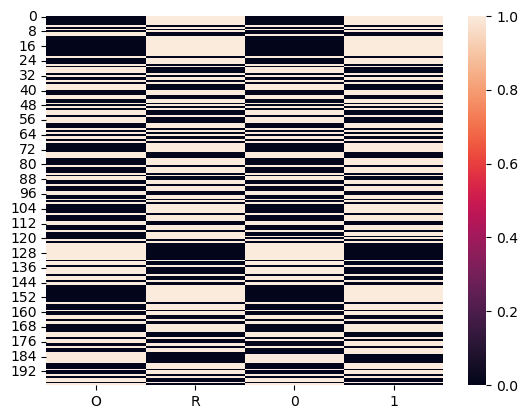

In [26]:
sns.heatmap(out_df)

In [27]:
data = tf.keras.utils.image_dataset_from_directory('/kaggle/input/waste-classification-data/DATASET/TRAIN', image_size=(256,256))

Found 22564 files belonging to 2 classes.


In [28]:
data = data.map(lambda x,y : (x/255, y))
batch = data.as_numpy_iterator().next()
batch[0].max()

1.0

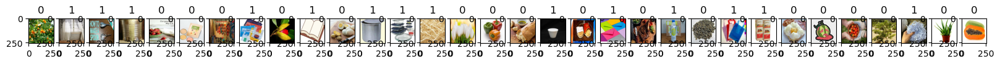

In [29]:
fig, ax = plt.subplots(ncols=32, figsize=(20,20))
for idx, img in enumerate(batch[0][:32]):
    ax[idx].imshow(img)
    ax[idx].title.set_text(batch[1][idx])

In [30]:
sample_ = len(data)/100
sample_

7.06

In [31]:
train_size = int(sample_ * .7)
val_size = int(sample_ * .2)+1
test_size = int(sample_ * .1)+1

train_size + val_size + test_size

7

In [32]:
train = data.take(train_size)
val = data.skip(train_size).take(val_size)
test = data.skip(train_size + val_size).take(test_size)

In [33]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Dropout

model = Sequential()

In [34]:
model.add(Conv2D(16, (3,3), 1, activation='relu', input_shape=(256, 256, 3)))
model.add(MaxPooling2D())

model.add(Conv2D(32, (3,3), 1, activation='relu'))
model.add(MaxPooling2D())

model.add(Conv2D(16, (3,3), 1, activation='relu'))
model.add(MaxPooling2D())

model.add(Flatten())

model.add(Dense(256, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

In [35]:
model.compile('adam', loss=tf.losses.BinaryCrossentropy(), metrics=['accuracy'])

In [36]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 254, 254, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 127, 127, 16)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 125, 125, 32)      4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 62, 62, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 60, 60, 16)        4624      
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 30, 30, 16)       0

In [37]:
hist = model.fit(train, epochs=25, validation_data=val)

Epoch 1/25
4/4 [==============================] - 5s 328ms/step - loss: 1.7950 - accuracy: 0.5312 - val_loss: 0.6736 - val_accuracy: 0.5156
Epoch 2/25
4/4 [==============================] - 1s 269ms/step - loss: 0.7107 - accuracy: 0.4688 - val_loss: 0.6569 - val_accuracy: 0.5781
Epoch 3/25
4/4 [==============================] - 1s 245ms/step - loss: 0.6353 - accuracy: 0.6797 - val_loss: 0.5438 - val_accuracy: 0.8281
Epoch 4/25
4/4 [==============================] - 1s 261ms/step - loss: 0.5655 - accuracy: 0.7109 - val_loss: 0.5036 - val_accuracy: 0.7656
Epoch 5/25
4/4 [==============================] - 1s 271ms/step - loss: 0.5210 - accuracy: 0.7812 - val_loss: 0.4943 - val_accuracy: 0.7812
Epoch 6/25
4/4 [==============================] - 1s 249ms/step - loss: 0.5140 - accuracy: 0.7578 - val_loss: 0.3932 - val_accuracy: 0.7812
Epoch 7/25
4/4 [==============================] - 1s 265ms/step - loss: 0.4798 - accuracy: 0.7578 - val_loss: 0.5294 - val_accuracy: 0.7812
Epoch 8/25
4/4 [====

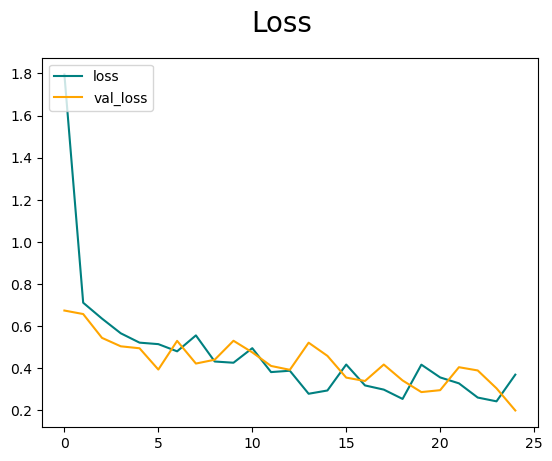

In [38]:
fig = plt.figure()
plt.plot(hist.history['loss'], color='teal', label='loss')
plt.plot(hist.history['val_loss'], color='orange', label='val_loss')
fig.suptitle('Loss', fontsize=20)
plt.legend(loc='upper left')
plt.show()

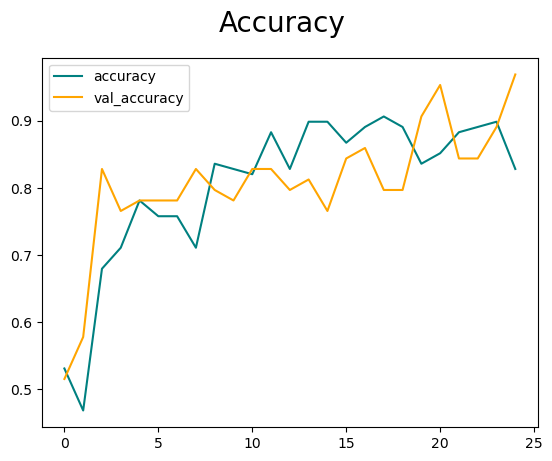

In [39]:
fig = plt.figure()
plt.plot(hist.history['accuracy'], color='teal', label='accuracy')
plt.plot(hist.history['val_accuracy'], color='orange', label='val_accuracy')
fig.suptitle('Accuracy', fontsize=20)
plt.legend(loc='upper left')
plt.show()

In [40]:
from tensorflow.keras.metrics import Precision, Recall, BinaryAccuracy

pre = Precision()
re = Recall()
acc = BinaryAccuracy()

for batch in test.as_numpy_iterator():
    x,y = batch
    y_ = model.predict(x)
    pre.update_state(y, y_)
    re.update_state(y, y_)
    acc.update_state(y, y_)

print('')
print(f"Precision: {pre.result().numpy()}, Recall: {re.result().numpy()}, Accuracy: {acc.result().numpy()}")
print('')

1/1 [==============================] - 0s 103ms/step

Precision: 0.7142857313156128, Recall: 0.6666666865348816, Accuracy: 0.71875



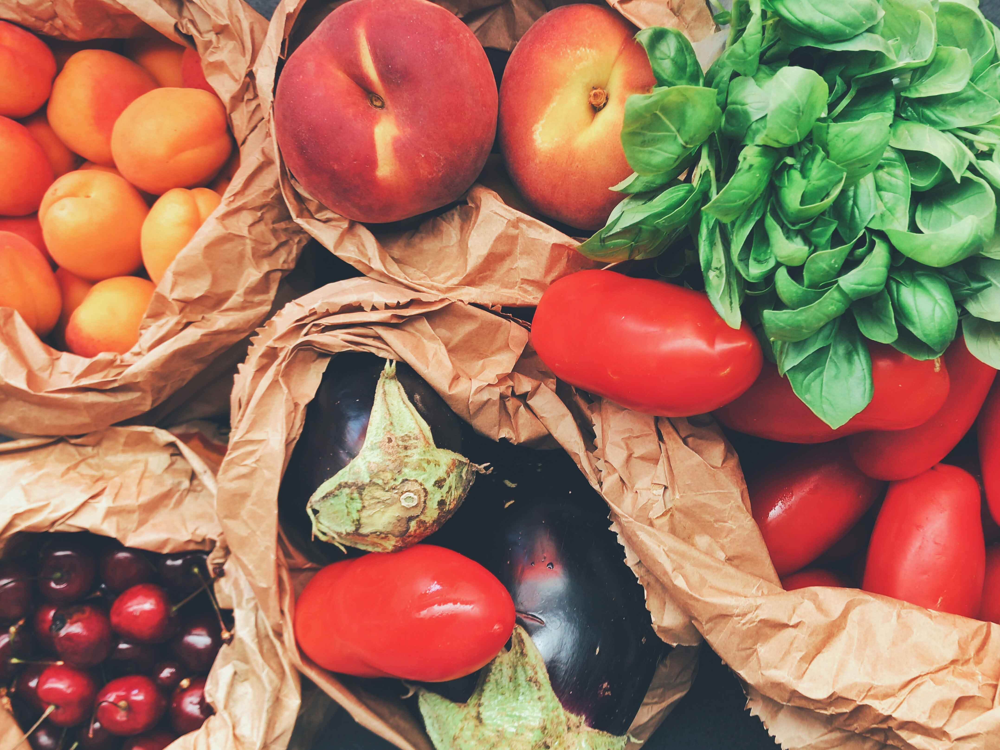

In [41]:
import cv2
img1 = image.load_img('/kaggle/input/dataset/data/biodegradable_0/food_waste/00000000.jpg')
img1

In [42]:
img1 = tf.image.resize(img1, (256, 256))

pred1 = model.predict(np.expand_dims(img1/255, 0))
pred1

1/1 [==============================] - 0s 129ms/step


array([[0.11550637]], dtype=float32)

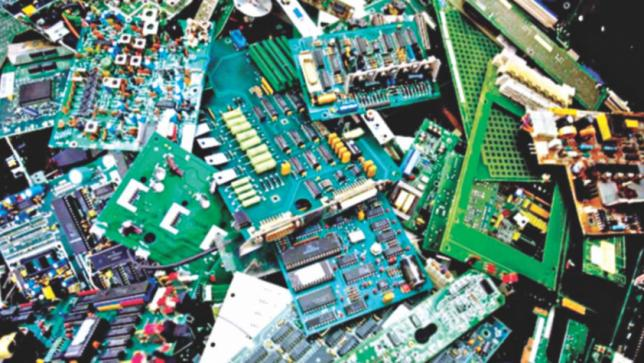

In [43]:
import cv2
img2 = image.load_img('/kaggle/input/dataset/data/non_biodegradable_0/ewaste/00000007.jpg')
img2

In [44]:
img2 = tf.image.resize(img2, (256, 256))

pred2 = model.predict(np.expand_dims(img2/255, 0))
pred2

1/1 [==============================] - 0s 26ms/step


array([[0.99925274]], dtype=float32)